# Import Necessary Libraries

In [ ]:
!pip install keras-cv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 52.8 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
# Importing dependencies

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.notebook import tqdm

import tensorflow as tf
from tensorflow.keras import *
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.callbacks import *
import keras_cv


BATCH_SIZE = 16
AUTO = tf.data.AUTOTUNE

In [ ]:
from tensorflow import keras
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
import io
from PIL import Image, ImageDraw, ImageFont

# Dataset Exploration

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Set the path to the dataset directory
dataset_path = '/content/drive/MyDrive/dataTA_Acnes'  # Replace with your actual dataset path

# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')
test_images_path = os.path.join(dataset_path, 'test', 'images')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0
num_test_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()
test_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Check test images sizes and count
for filename in os.listdir(test_images_path):
    if filename.endswith('.jpg'):
        num_test_images += 1
        image_path = os.path.join(test_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")
print(f"Number of test images: {num_test_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")


# Check if all images in test set have the same size
if len(test_image_sizes) == 1:
    print(f"All test images have the same size: {test_image_sizes.pop()}")
else:
    print("Test images have varying sizes.")

Number of training images: 823
Number of validation images: 56
Number of test images: 48
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)
Test images have varying sizes.


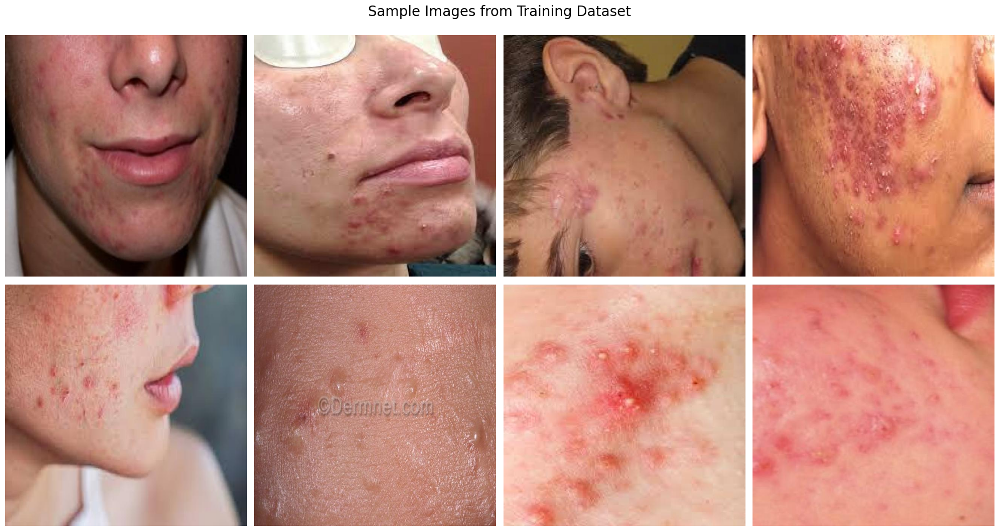

In [ ]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

# Preproccessing

In [ ]:
# a function for converting txt file to list
def parse_txt_annot(img_path, txt_path):
    img = cv2.imread(img_path)
    w = int(img.shape[0])
    h = int(img.shape[1])

    file_label = open(txt_path, "r")
    lines = file_label.read().split('\n')

    boxes = []
    classes = []

    if lines[0] == '':
        return img_path, classes, boxes
    else:
        for i in range(0, int(len(lines))):
            objbud=lines[i].split(' ')
            class_ = int(objbud[0])

            x1 = float(objbud[1])
            y1 = float(objbud[2])
            w1 = float(objbud[3])
            h1 = float(objbud[4])

            xmin = int((x1*w) - (w1*w)/2.0)
            ymin = int((y1*h) - (h1*h)/2.0)
            xmax = int((x1*w) + (w1*w)/2.0)
            ymax = int((y1*h) + (h1*h)/2.0)

            boxes.append([xmin ,ymin ,xmax ,ymax])
            classes.append(class_)

    return img_path, classes, boxes


# a function for creating file paths list
def create_paths_list(path):
    full_path = []
    images = sorted(os.listdir(path))

    for i in images:
        full_path.append(os.path.join(path, i))

    return full_path


class_ids = ['Acne']
class_mapping = {0: 'Acne'}

In [ ]:
# a function for creating a dict format of files
def creating_files(img_files_paths, annot_files_paths):

    img_files = create_paths_list(img_files_paths)
    annot_files = create_paths_list(annot_files_paths)

    image_paths = []
    bbox = []
    classes = []

    for i in range(0,len(img_files)):
        image_path_, classes_, bbox_ = parse_txt_annot(img_files[i], annot_files[i])
        image_paths.append(image_path_)
        bbox.append(bbox_)
        classes.append(classes_)

    image_paths = tf.ragged.constant(image_paths)
    bbox = tf.ragged.constant(bbox)
    classes = tf.ragged.constant(classes)

    return image_paths, classes, bbox

In [ ]:
# Membuat dataset loader
train_img_paths, train_classes, train_bboxes = creating_files(
    '/content/drive/MyDrive/dataTA_Acnes/train/images',
    '/content/drive/MyDrive/dataTA_Acnes/train/labels'
)

valid_img_paths, valid_classes, valid_bboxes = creating_files(
    '/content/drive/MyDrive/dataTA_Acnes/valid/images',
    '/content/drive/MyDrive/dataTA_Acnes/valid/labels'
)

test_img_paths, test_classes, test_bboxes = creating_files(
    '/content/drive/MyDrive/dataTA_Acnes/test/images',
    '/content/drive/MyDrive/dataTA_Acnes/test/labels'
)


# Creating Datasets

In [ ]:
# reading and resizing images
def img_preprocessing(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels = 3)
    img = tf.cast(img, tf.float32)

    return img


resizing = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    scale_factor=(0.8, 1.25),
    bounding_box_format="xyxy")

# loading dataset
def load_ds(img_paths, classes, bbox):
    img = img_preprocessing(img_paths)

    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox }

    return {"images": img, "bounding_boxes": bounding_boxes}

def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]

In [ ]:
# Creating dataset loaders and tf.datasets
train_loader = tf.data.Dataset.from_tensor_slices((train_img_paths, train_classes, train_bboxes))
train_dataset = (train_loader
                 .map(load_ds, num_parallel_calls = AUTO)
                 .shuffle(BATCH_SIZE*10)
                 .ragged_batch(BATCH_SIZE, drop_remainder = True)
                 .map(resizing, num_parallel_calls = AUTO)
                 .map(dict_to_tuple, num_parallel_calls = AUTO)
                 .prefetch(AUTO))


valid_loader = tf.data.Dataset.from_tensor_slices((valid_img_paths, valid_classes, valid_bboxes))
valid_dataset = (valid_loader
                 .map(load_ds, num_parallel_calls = AUTO)
                 .ragged_batch(BATCH_SIZE, drop_remainder = True)
                 .map(resizing, num_parallel_calls = AUTO)
                 .map(dict_to_tuple, num_parallel_calls = AUTO)
                 .prefetch(AUTO))


test_loader = tf.data.Dataset.from_tensor_slices((test_img_paths, test_classes, test_bboxes))
test_dataset = (test_loader
                .map(load_ds, num_parallel_calls = AUTO)
                .ragged_batch(BATCH_SIZE, drop_remainder = True)
                .map(resizing, num_parallel_calls = AUTO)
                .map(dict_to_tuple, num_parallel_calls = AUTO)
                .prefetch(AUTO))

# Deteksi 1- Lokasi Jerawat

In [ ]:
# a function to visualize samples from a dataset

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs[0], inputs[1]

    keras_cv.visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale = 6,
        font_scale = 0.8,
        line_thickness=2,
        dpi = 100,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
        true_color = (192, 57, 43))

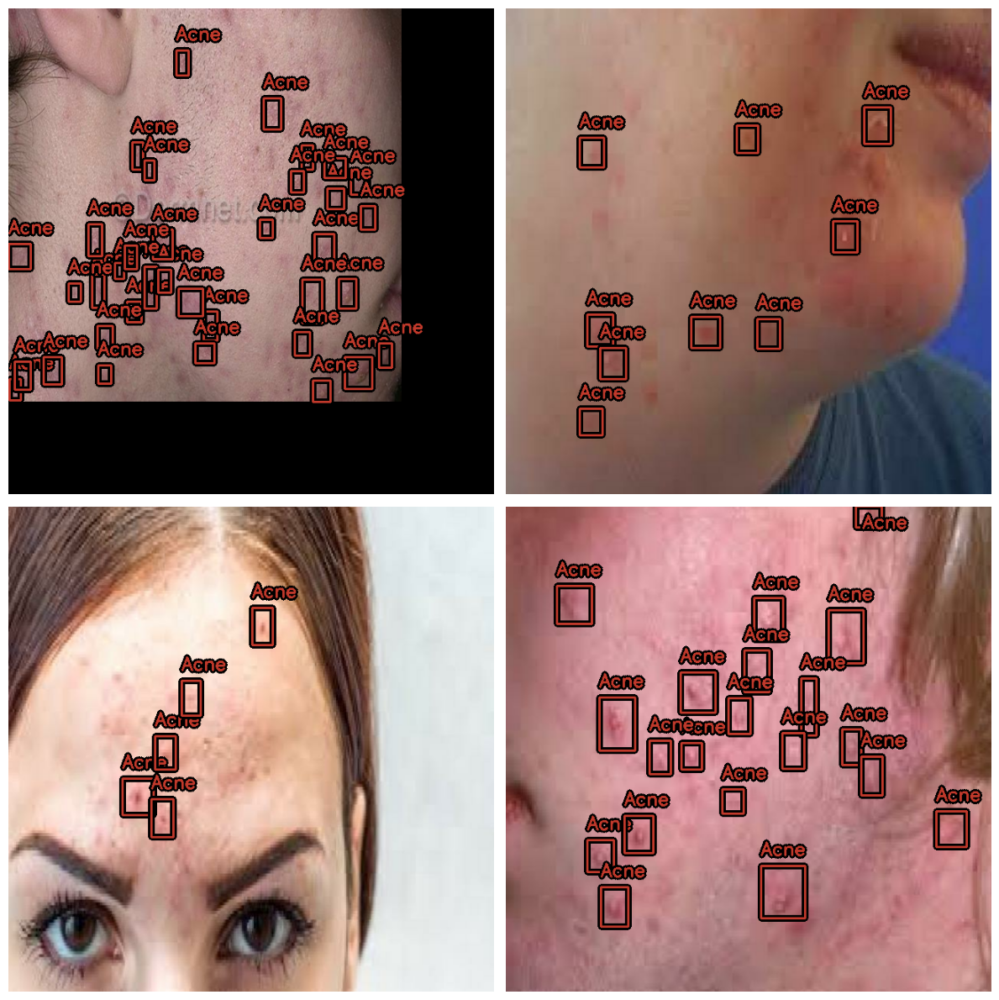

In [ ]:
# examples images and annotations from training daatset
visualize_dataset(train_dataset, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2)

**Training yoloV8 Model**

In [ ]:
# creating mirrored strategy

stg = tf.distribute.MirroredStrategy()

In [ ]:
# creating yolo backbone

with stg.scope():
    backbone = keras_cv.models.YOLOV8Backbone.from_preset("yolo_v8_xs_backbone", include_rescaling = True)

    YOLOV8_model = keras_cv.models.YOLOV8Detector(num_classes=len(class_mapping),
                                                  bounding_box_format = "xyxy", backbone = backbone, fpn_depth = 5)

    optimizer = AdamW(learning_rate=0.0007, weight_decay=0.0009, global_clipnorm = 10.0)
    my_callbacks = [ModelCheckpoint('/kaggle/working/yolo_acne_detection.weights.h5', # Changed the filename to end with '.weights.h5'
                                     monitor = 'val_loss',
                                     save_best_only = True,
                                     save_weights_only = True),
                    ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=8, verbose=0, min_delta=0.001),
                    EarlyStopping(monitor='val_loss', patience=20)]


    YOLOV8_model.compile(optimizer = optimizer, classification_loss = 'binary_crossentropy', box_loss = 'ciou')

100%|██████████| 631/631 [00:00<00:00, 818kB/s]


In [ ]:
hist = YOLOV8_model.fit(train_dataset, validation_data = valid_dataset,  epochs = 140, callbacks = my_callbacks)

Epoch 1/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 75s 709ms/step - box_loss: 5.2913 - class_loss: 162.5800 - loss: 167.8713 - val_box_loss: 4.5336 - val_class_loss: 83.3587 - val_loss: 87.8923 - learning_rate: 7.0000e-04
Epoch 2/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 34s 636ms/step - box_loss: 3.9695 - class_loss: 37.0131 - loss: 40.9825 - val_box_loss: 3.5171 - val_class_loss: 37.2907 - val_loss: 40.8078 - learning_rate: 7.0000e-04
Epoch 3/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 34s 645ms/step - box_loss: 3.8590 - class_loss: 20.3838 - loss: 24.2428 - val_box_loss: 3.7374 - val_class_loss: 16.6755 - val_loss: 20.4128 - learning_rate: 7.0000e-04
Epoch 4/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 34s 637ms/step - box_loss: 3.7167 - class_loss: 9.3490 - loss: 13.0658 - val_box_loss: 3.8152 - val_class_loss: 6.5789 - val_loss: 10.3941 - learning_rate: 7.0000e-04
Epoch 5/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 35s 645ms/step - box_loss: 3.6916 - class_loss: 4.7874 - loss: 8.4791 - val_box_loss: 3.6062 - val_class_loss: 4.3145 - val_loss:

In [ ]:
# After training your model
YOLOV8_model.save('yolo_acne_detection_model.h5')

In [ ]:
print(hist.history.keys())

dict_keys(['box_loss', 'class_loss', 'loss', 'val_box_loss', 'val_class_loss', 'val_loss', 'learning_rate'])


**Training Results, Evaluation**

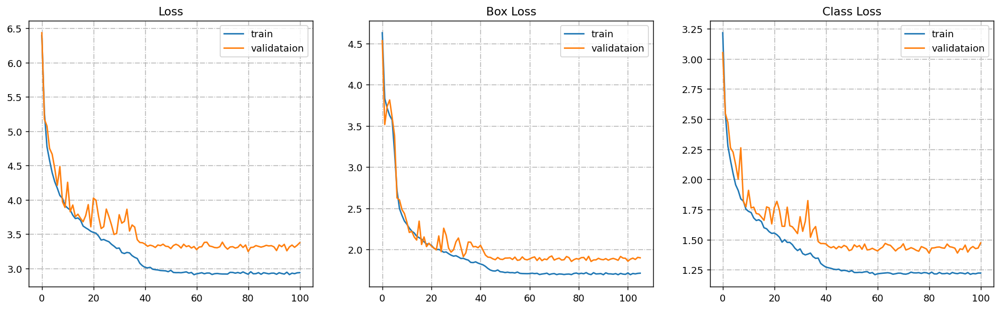

In [ ]:
fig, axs = plt.subplots(1,3, figsize = (18,5), dpi = 130)

axs[0].grid(linestyle="dashdot")
axs[0].set_title("Loss")
axs[0].plot(hist.history['loss'][5:])
axs[0].plot(hist.history['val_loss'][5:])
axs[0].legend(["train", "validataion"])

axs[1].grid(linestyle="dashdot")
axs[1].set_title("Box Loss")
axs[1].plot(hist.history['box_loss'])
axs[1].plot(hist.history['val_box_loss'])
axs[1].legend(["train",  "validataion"])

axs[2].grid(linestyle="dashdot")
axs[2].set_title("Class Loss")
axs[2].plot(hist.history['class_loss'][5:])
axs[2].plot(hist.history['val_class_loss'][5:])
axs[2].legend(["train",  "validataion"])

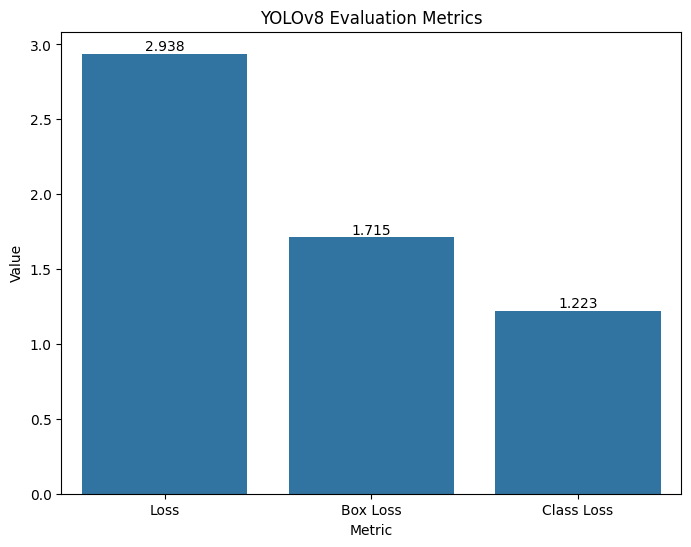

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'hist' is your History object from model training
# Define the metrics you want to plot
metrics = [("Loss", 'loss', 'val_loss'),
           ("Box Loss", 'box_loss', 'val_box_loss'),
           ("Class Loss", 'class_loss', 'val_class_loss')]

# Create a bar plot
plt.figure(figsize=(8, 6))

# Extract labels and values from the metrics list
labels = [metric[0] for metric in metrics]
values = [hist.history[metric[1]][-1] for metric in metrics]

sns.barplot(x=labels, y=values)
plt.title('YOLOv8 Evaluation Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')

# Add values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.3f}', ha='center', va='bottom')

plt.show()

**Test Predictions**

In [ ]:
evaluation=YOLOV8_model.evaluate(test_dataset)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - box_loss: 1.9784 - class_loss: 1.3799 - loss: 3.3583


In [ ]:
def visualize_predict_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))

    y_pred = model.predict(images, verbose = 0)
    # Instead of converting to ragged, use to_dense
    y_pred = keras_cv.bounding_box.to_dense(y_pred)

    keras_cv.visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        true_color = (192, 57, 43),
        pred_color=(255, 235, 59),
        scale = 8,
        font_scale = 0.8,
        line_thickness=2,
        dpi = 100,
        rows=2,
        cols=2,
        show=True,
        class_mapping=class_mapping,
    )

In [ ]:
# red -> ground true
# yellow -> prediction
visualize_predict_detections(YOLOV8_model, dataset = test_dataset, bounding_box_format="xyxy")

In [ ]:
for images, y_true in test_dataset.take(1):
    y_pred = YOLOV8_model.predict(images, verbose=0)
    print(y_pred)


{'boxes': array([[[350.40137  , 484.4323   , 404.11246  , 543.39417  ],
        [406.70636  , 346.52127  , 450.6103   , 377.88577  ],
        [366.96695  , 550.01605  , 404.83066  , 578.14075  ],
        ...,
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ]],

       [[ 43.787407 , 162.05412  ,  72.874374 , 216.58696  ],
        [398.55637  , 206.47672  , 430.20688  , 266.8365   ],
        [109.63908  , 279.7807   , 141.85326  , 339.16745  ],
        ...,
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ]],

       [[391.54782  ,  52.562977 , 441.4088   , 128.73454  ],
        [273.328    , 157.90945  , 320.3583   , 236.35434  ],
        [276.24408  , 307.43506  , 326.40845  , 371.605    ],
        ...,
        [ -1.    

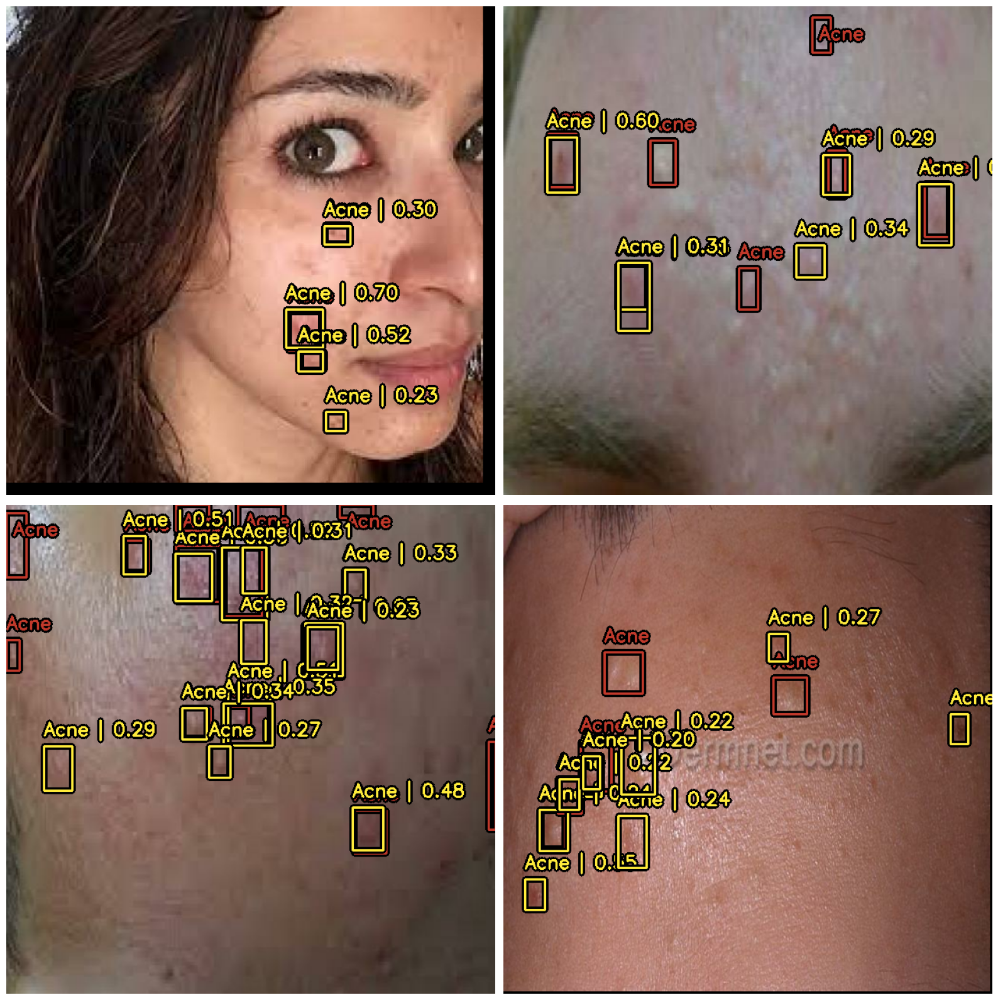

Precision: 0.8200
Recall: 0.8958
F1-Score: 0.8562
Accuracy: 0.8958


<ipython-input-30-d0e9823cb4d6>:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + ['Acne', 'No Acne'])
<ipython-input-30-d0e9823cb4d6>:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([''] + ['Acne', 'No Acne'])


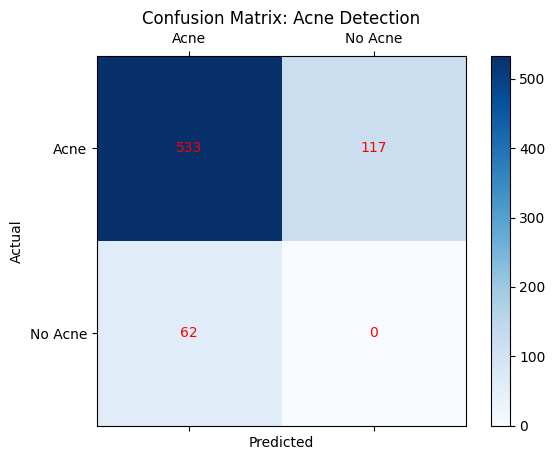

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def is_overlapping(box1, box2):
    """Check if two boxes overlap."""
    x1_overlap = tf.maximum(tf.cast(box1[0], tf.float32), tf.cast(box2[0], tf.float32)) < tf.minimum(tf.cast(box1[2], tf.float32), tf.cast(box2[2], tf.float32))
    y1_overlap = tf.maximum(tf.cast(box1[1], tf.float32), tf.cast(box2[1], tf.float32)) < tf.minimum(tf.cast(box1[3], tf.float32), tf.cast(box2[3], tf.float32))
    return tf.logical_and(x1_overlap, y1_overlap)

def evaluate_model_on_dataset(model, dataset, confidence_threshold=0.2):
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    total_true_boxes = 0

    for images, y_true in dataset:
        y_pred = model.predict(images, verbose=0)

        true_boxes = y_true['boxes']
        pred_boxes = y_pred['boxes']
        pred_scores = y_pred['confidence']
        num_detections = y_pred['num_detections']

        for i in range(true_boxes.shape[0]):
            current_true_boxes = tf.cast(true_boxes[i], tf.float32)  # Ensure correct data type
            current_pred_boxes = tf.cast(pred_boxes[i][:num_detections[i]], tf.float32)  # Get valid predictions with correct data type
            current_pred_scores = pred_scores[i][:num_detections[i]]

            total_true_boxes += tf.shape(current_true_boxes)[0]

            matched_true_boxes = set()

            for j, pred_box in enumerate(current_pred_boxes):
                if current_pred_scores[j] >= confidence_threshold:
                    overlap = tf.reduce_any([is_overlapping(pred_box, true_box) for true_box in current_true_boxes])
                    if overlap:
                        true_positives += 1
                        matched_true_boxes.add(j)
                    else:
                        false_positives += 1

            false_negatives += tf.shape(current_true_boxes)[0] - len(matched_true_boxes)

    precision = true_positives / tf.maximum(tf.cast(true_positives + false_positives, tf.float32), tf.constant(1e-10, dtype=tf.float32))
    recall = true_positives / tf.maximum(tf.cast(true_positives + false_negatives, tf.float32), tf.constant(1e-10, dtype=tf.float32))
    f1_score = 2 * (precision * recall) / tf.maximum(precision + recall, tf.constant(1e-10, dtype=tf.float32))

    accuracy = true_positives / tf.maximum(tf.cast(total_true_boxes, tf.float32), tf.constant(1e-10, dtype=tf.float32))

    return precision, recall, f1_score, accuracy, true_positives, false_positives, false_negatives

def plot_confusion_matrix(tp, fp, fn):
    tn = 0  # True negatives are not directly calculable in object detection

    # Matriks kebingungan
    cm = np.array([[tp, fp], [fn, tn]])

    fig, ax = plt.subplots()
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    plt.colorbar(cax)

    # Label untuk sumbu X dan Y
    ax.set_xticklabels([''] + ['Acne', 'No Acne'])
    ax.set_yticklabels([''] + ['Acne', 'No Acne'])

    # Penempatan label
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    # Tampilkan nilai di dalam matriks
    for i in range(2):
        for j in range(2):
            plt.text(j, i, str(cm[i, j]), ha='center', va='center', color='red')

    plt.title('Confusion Matrix: Acne Detection')
    plt.show()


def visualize_and_evaluate(model, dataset):
    precision, recall, f1_score, accuracy, tp, fp, fn = evaluate_model_on_dataset(model, dataset)

    # Visualize predictions
    visualize_predict_detections(model, dataset, bounding_box_format="xyxy")

    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1_score:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    # Plot confusion matrix
    plot_confusion_matrix(tp, fp, fn)

# Load weights and evaluate model
#YOLOV8_model.load_weights('/kaggle/working/yolo_acne_detection.weights.h5')
visualize_and_evaluate(YOLOV8_model, dataset=test_dataset)


**deteksi dari gambar baru**

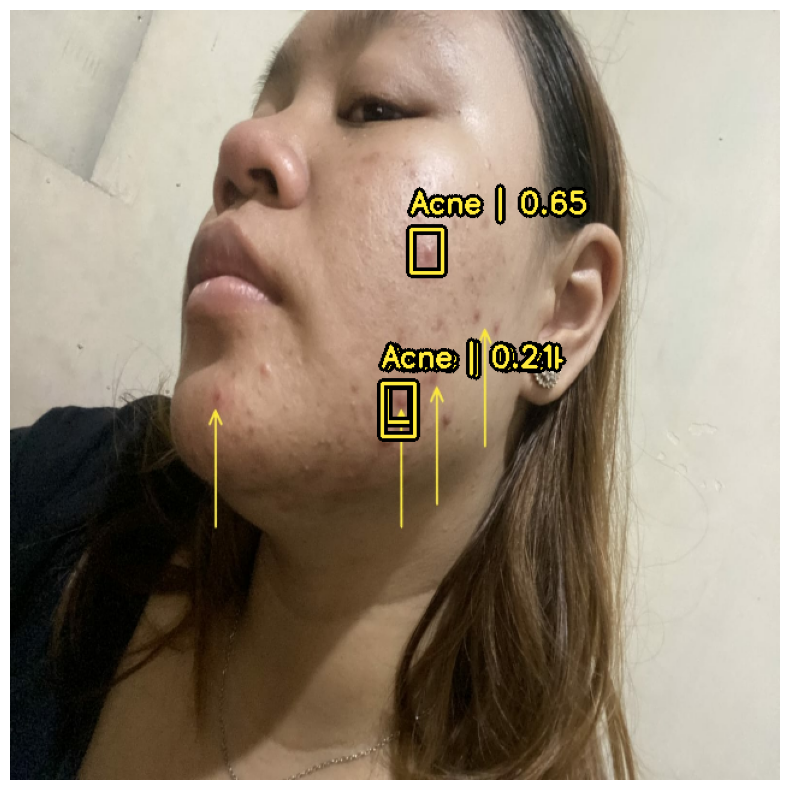

In [ ]:
# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.cast(img, tf.float32)
    # Resize to the input size expected by the model (640x640)
    img = tf.image.resize(img, (640, 640))
    return img

def visualize_single_image_predictions(model, image_path, bounding_box_format):
    img = load_and_preprocess_image(image_path)
    img_batch = tf.expand_dims(img, axis=0)  # Add batch dimension

    # Run inference
    y_pred = model.predict(img_batch, verbose=0)
    # Remove the call to `to_ragged`
    # y_pred = keras_cv.bounding_box.to_ragged(y_pred)

    # Visualize predictions
    keras_cv.visualization.plot_bounding_box_gallery(
        img_batch,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_pred=y_pred,
        pred_color=(255, 235, 59),  # Yellow color for predictions
        scale=8,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        rows=1,
        cols=1,
        show=True,
        class_mapping=class_mapping, # Make sure class_mapping is defined correctly
    )


# Path to your test image
test_image_path = 'test.jpg'  # Replace with your image path

# Visualize predictions on the test image
visualize_single_image_predictions(
    YOLOV8_model, test_image_path, bounding_box_format="xyxy"
)

# Deteksi 2- Jumlah jerawat

**preprocessing**

In [ ]:
import cv2
import os

# Fungsi untuk membaca file anotasi teks dan mengonversinya menjadi daftar bounding box dan kelas objek
def parse_txt_annotations(img_path, txt_path):
    img = cv2.imread(img_path)
    w = int(img.shape[0])
    h = int(img.shape[1])

    # Membaca file anotasi
    with open(txt_path, "r", encoding='utf-8-sig') as file_label:
        lines = file_label.read().split('\n')

    boxes = []  # Daftar bounding box
    classes = []  # Daftar kelas objek

    # Jika file anotasi kosong, kembalikan jalur gambar, kelas kosong, dan bounding box kosong
    if lines[0] == '':
        return img_path, classes, boxes
    else:
        for line in lines:
            if line.strip():  # Memastikan tidak ada baris kosong
                objbud = line.split(' ')
                class_ = int(objbud[0].strip().replace('\ufeff', ''))  # ID kelas

                x1 = float(objbud[1])  # Koordinat tengah X
                y1 = float(objbud[2])  # Koordinat tengah Y
                w1 = float(objbud[3])  # Lebar bounding box
                h1 = float(objbud[4])  # Tinggi bounding box

                # Menghitung koordinat bounding box
                xmin = int((x1 * w) - (w1 * w) / 2.0)
                ymin = int((y1 * h) - (h1 * h) / 2.0)
                xmax = int((x1 * w) + (w1 * w) / 2.0)
                ymax = int((y1 * h) + (h1 * h) / 2.0)

                boxes.append([xmin, ymin, xmax, ymax])
                classes.append(class_)

    return img_path, classes, boxes

# Fungsi untuk membuat daftar jalur file
def create_file_paths_list(directory_path):
    file_paths = []
    image_files = sorted(os.listdir(directory_path))

    for image_file in image_files:
        file_paths.append(os.path.join(directory_path, image_file))

    return file_paths


In [ ]:
# Fungsi untuk membuat format kamus dari file
def create_file_dictionary(image_files_directory, annotation_files_directory):

    image_files = create_file_paths_list(image_files_directory)
    annotation_files = create_file_paths_list(annotation_files_directory)

    image_file_paths = []
    bounding_boxes = []
    object_classes = []

    for index in range(len(image_files)):
        image_path, object_classes_list, bounding_boxes_list = parse_txt_annotations(image_files[index], annotation_files[index])
        image_file_paths.append(image_path)
        bounding_boxes.append(bounding_boxes_list)
        object_classes.append(object_classes_list)

    image_file_paths = tf.ragged.constant(image_file_paths)
    bounding_boxes = tf.ragged.constant(bounding_boxes)
    object_classes = tf.ragged.constant(object_classes)

    return image_file_paths, object_classes, bounding_boxes


In [ ]:
# Membuat dataset loader
training_image_paths, training_classes, training_bounding_boxes = create_file_dictionary(
    '/content/drive/MyDrive/dataTA_Acnes/train/images',
    '/content/drive/MyDrive/dataTA_Acnes/train/labels'
)

validation_image_paths, validation_classes, validation_bounding_boxes = create_file_dictionary(
    '/content/drive/MyDrive/dataTA_Acnes/valid/images',
    '/content/drive/MyDrive/dataTA_Acnes/valid/labels'
)

testing_image_paths, testing_classes, testing_bounding_boxes = create_file_dictionary(
    '/content/drive/MyDrive/dataTA_Acnes/test/images',
    '/content/drive/MyDrive/dataTA_Acnes/test/labels'
)


In [ ]:
# Membaca dan mengubah ukuran gambar
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32)

    return image

resize_layer = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    scale_factor=(0.8, 1.25),
    bounding_box_format="xyxy")

# Memuat dataset
def load_dataset(image_paths, object_classes, bounding_boxes):
    image = preprocess_image(image_paths)

    bounding_box_data = {
        "classes": tf.cast(object_classes, dtype=tf.float32),
        "boxes": bounding_boxes
    }

    return {"images": image, "bounding_boxes": bounding_box_data}

def convert_dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]


In [ ]:
# Membuat dataset loaders dan tf.datasets
training_loader = tf.data.Dataset.from_tensor_slices((training_image_paths, training_classes, training_bounding_boxes))
training_dataset = (training_loader
                    .map(load_dataset, num_parallel_calls=AUTO)
                    .shuffle(BATCH_SIZE * 10)
                    .ragged_batch(BATCH_SIZE, drop_remainder=True)
                    .map(resize_layer, num_parallel_calls=AUTO)
                    .map(convert_dict_to_tuple, num_parallel_calls=AUTO)
                    .prefetch(AUTO))

validation_loader = tf.data.Dataset.from_tensor_slices((validation_image_paths, validation_classes, validation_bounding_boxes))
validation_dataset = (validation_loader
                      .map(load_dataset, num_parallel_calls=AUTO)
                      .ragged_batch(BATCH_SIZE, drop_remainder=True)
                      .map(resize_layer, num_parallel_calls=AUTO)
                      .map(convert_dict_to_tuple, num_parallel_calls=AUTO)
                      .prefetch(AUTO))

testing_loader = tf.data.Dataset.from_tensor_slices((testing_image_paths, testing_classes, testing_bounding_boxes))
testing_dataset = (testing_loader
                   .map(load_dataset, num_parallel_calls=AUTO)
                   .ragged_batch(BATCH_SIZE, drop_remainder=True)
                   .map(resize_layer, num_parallel_calls=AUTO)
                   .map(convert_dict_to_tuple, num_parallel_calls=AUTO)
                   .prefetch(AUTO))


In [ ]:
def visualize_dataset(dataset, bounding_box_format, class_mapping, max_images=4):
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    images_displayed = 0  # Counter for the number of images displayed

    for batch in dataset:
        images, bounding_boxes = batch
        batch_size = images.shape[0]

        for i in range(batch_size):
            if images_displayed >= max_images:
                break  # Stop if the maximum number of images has been reached

            img = images[i].numpy().astype('uint8')
            bboxes = bounding_boxes['boxes'][i].numpy()
            classes = bounding_boxes['classes'][i].numpy().astype(int)

            img_height, img_width = img.shape[0], img.shape[1]

            fig, ax = plt.subplots(1)
            ax.imshow(img)

            labels = []  # List to store labels for printing beside the photo

            # Start numbering bounding boxes from 1
            for idx, (bbox, cls) in enumerate(zip(bboxes, classes), start=1):
                x_min, y_min, x_max, y_max = bbox

                # Calculate width and height
                width = x_max - x_min
                height = y_max - y_min

                # Calculate center coordinates
                x_center = x_min + width / 2
                y_center = y_min + height / 2

                # Normalize coordinates
                x_center_norm = x_center / img_width
                y_center_norm = y_center / img_height
                width_norm = width / img_width
                height_norm = height / img_height

                # Format label with order number
                label = f"{idx} {x_center_norm:.8f} {y_center_norm:.8f} {width_norm:.8f} {height_norm:.8f}"
                labels.append(label)

                # Create a Rectangle patch
                rect = patches.Rectangle(
                    (x_min, y_min),
                    width,
                    height,
                    linewidth=2,
                    edgecolor='red',
                    facecolor='none'
                )

                # Add the patch to the Axes
                ax.add_patch(rect)

                # Add sequential number as label on the bounding box
                ax.text(
                    x_min,
                    y_min - 10,
                    str(idx),  # Display the index number
                    color='red',
                    fontsize=12,
                    bbox=dict(facecolor='yellow', alpha=0.5)
                )

            plt.axis('off')
            plt.show()

            images_displayed += 1

        if images_displayed >= max_images:
            break  # Stop if the maximum number of images has been reached


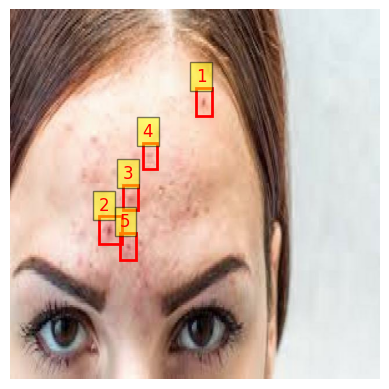

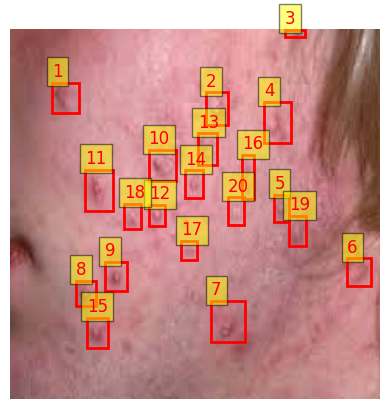

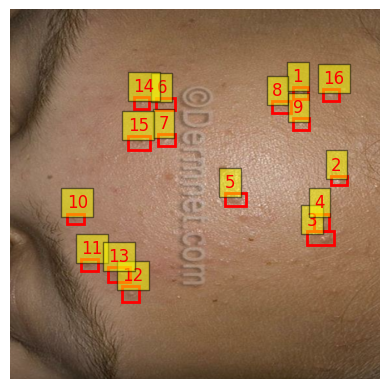

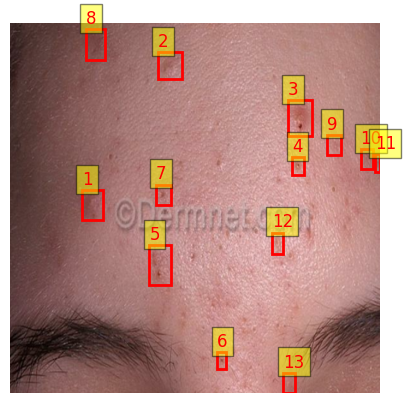

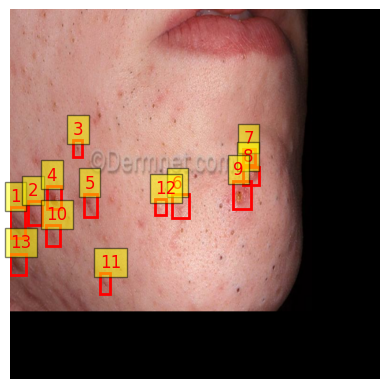

In [ ]:
visualize_dataset(
    training_dataset,
    bounding_box_format="xyxy",
    class_mapping=class_mapping,
    max_images=5  # Change this number as needed
)

**training yolov8 model**

In [ ]:
# Membuat strategi mirrored
distribution_strategy = tf.distribute.MirroredStrategy()


In [ ]:
# Membuat YOLO backbone

with distribution_strategy.scope():
    yolo_backbone = keras_cv.models.YOLOV8Backbone.from_preset("yolo_v8_xs_backbone", include_rescaling=True)

    yolo_model = keras_cv.models.YOLOV8Detector(
        num_classes=len(class_mapping),
        bounding_box_format="xyxy",
        backbone=yolo_backbone,
        fpn_depth=5
    )

    optimizer = AdamW(learning_rate=0.0007, weight_decay=0.0009, global_clipnorm=10.0)
    callbacks = [
        ModelCheckpoint(
            '/kaggle/working/yolo_acne_detection.weights.h5',  # Mengubah nama file agar diakhiri dengan '.weights.h5'
            monitor='val_loss',
            save_best_only=True,
            save_weights_only=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.01,
            patience=8,
            verbose=0,
            min_delta=0.001
        ),
        EarlyStopping(monitor='val_loss', patience=20)
    ]

    yolo_model.compile(
        optimizer=optimizer,
        classification_loss='binary_crossentropy',
        box_loss='ciou'
    )


In [ ]:
history = yolo_model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=140,
    callbacks=callbacks
)


Epoch 1/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 65s 699ms/step - box_loss: 5.3743 - class_loss: 188.3344 - loss: 193.7087 - val_box_loss: 6.1718 - val_class_loss: 5263.2578 - val_loss: 5269.4297 - learning_rate: 7.0000e-04
Epoch 2/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 34s 639ms/step - box_loss: 4.1969 - class_loss: 57.3979 - loss: 61.5948 - val_box_loss: 5.5062 - val_class_loss: 118.6180 - val_loss: 124.1242 - learning_rate: 7.0000e-04
Epoch 3/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 34s 630ms/step - box_loss: 4.0325 - class_loss: 35.1795 - loss: 39.2119 - val_box_loss: 4.1683 - val_class_loss: 25.6738 - val_loss: 29.8420 - learning_rate: 7.0000e-04
Epoch 4/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 34s 629ms/step - box_loss: 3.8833 - class_loss: 18.8252 - loss: 22.7086 - val_box_loss: 3.5983 - val_class_loss: 14.5993 - val_loss: 18.1976 - learning_rate: 7.0000e-04
Epoch 5/140
51/51 ━━━━━━━━━━━━━━━━━━━━ 34s 630ms/step - box_loss: 3.6592 - class_loss: 7.2951 - loss: 10.9543 - val_box_loss: 3.7905 - val_class_loss: 5.6314 - 

In [ ]:
# Setelah melatih model
yolo_model.save('yolo_acne_detection_model_count.h5')


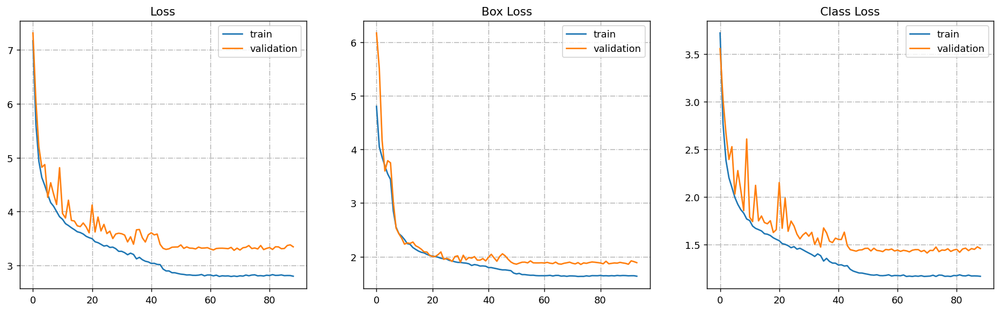

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(18, 5), dpi=130)

axs[0].grid(linestyle="dashdot")
axs[0].set_title("Loss")
axs[0].plot(history.history['loss'][5:])
axs[0].plot(history.history['val_loss'][5:])
axs[0].legend(["train", "validation"])

axs[1].grid(linestyle="dashdot")
axs[1].set_title("Box Loss")
axs[1].plot(history.history['box_loss'])
axs[1].plot(history.history['val_box_loss'])
axs[1].legend(["train", "validation"])

axs[2].grid(linestyle="dashdot")
axs[2].set_title("Class Loss")
axs[2].plot(history.history['class_loss'][5:])
axs[2].plot(history.history['val_class_loss'][5:])
axs[2].legend(["train", "validation"])


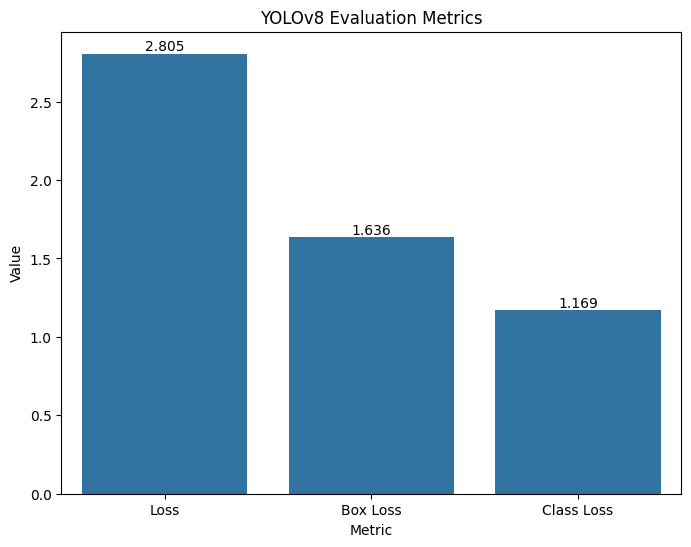

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Menggunakan objek History bernama 'history' dari pelatihan model
# Mendefinisikan metrik yang ingin di-plot
metrics = [
    ("Loss", 'loss', 'val_loss'),
    ("Box Loss", 'box_loss', 'val_box_loss'),
    ("Class Loss", 'class_loss', 'val_class_loss')
]

# Membuat plot batang
plt.figure(figsize=(8, 6))

# Ekstrak label dan nilai dari daftar metrik
labels = [metric[0] for metric in metrics]
values = [history.history[metric[1]][-1] for metric in metrics]

sns.barplot(x=labels, y=values)
plt.title('YOLOv8 Evaluation Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')

# Menambahkan nilai di atas batang
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.3f}', ha='center', va='bottom')

plt.show()


**test prediction**

In [ ]:
results = yolo_model.evaluate(testing_dataset)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - box_loss: 1.9818 - class_loss: 1.4114 - loss: 3.3932


In [ ]:
def visualize_predictions(dataset, bounding_box_format, class_mapping, max_images=4):
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    images_displayed = 0  # Counter for the number of images displayed

    for batch in dataset:
        images, bounding_boxes = batch
        batch_size = images.shape[0]

        for i in range(batch_size):
            if images_displayed >= max_images:
                break  # Stop if the maximum number of images has been reached

            img = images[i].numpy().astype('uint8')
            bboxes = bounding_boxes['boxes'][i].numpy()
            classes = bounding_boxes['classes'][i].numpy().astype(int)

            img_height, img_width = img.shape[0], img.shape[1]

            fig, ax = plt.subplots(1)
            ax.imshow(img)

            # Start numbering bounding boxes from 1
            for idx, bbox in enumerate(bboxes, start=1):
                x_min, y_min, x_max, y_max = bbox

                # Calculate width and height
                width = x_max - x_min
                height = y_max - y_min

                # Create a Rectangle patch
                rect = patches.Rectangle(
                    (x_min, y_min),
                    width,
                    height,
                    linewidth=2,
                    edgecolor='red',
                    facecolor='none'
                )

                # Add the patch to the Axes
                ax.add_patch(rect)

                # Add sequential number as label on the bounding box
                ax.text(
                    x_min,
                    y_min - 10,
                    str(idx),  # Display only the index number
                    color='red',
                    fontsize=12,
                    bbox=dict(facecolor='yellow', alpha=0.5)
                )

            plt.axis('off')
            plt.show()

            images_displayed += 1

        if images_displayed >= max_images:
            break  # Stop if the maximum number of images has been reached


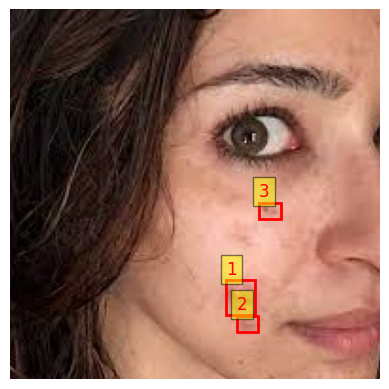

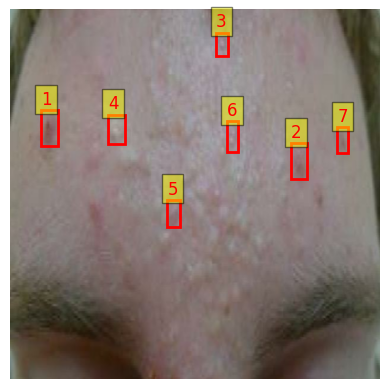

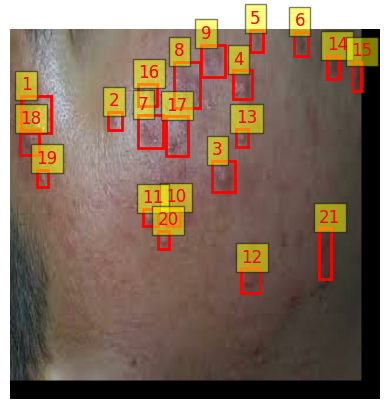

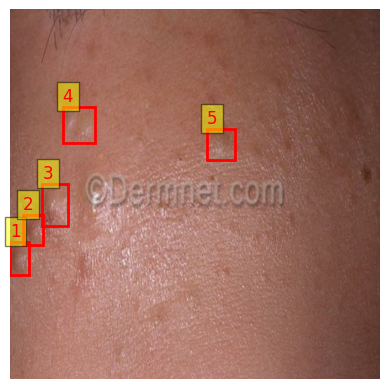

In [ ]:
# Merah -> ground truth
# Kuning -> prediksi
visualize_predictions(
    dataset=testing_dataset,
    bounding_box_format="xyxy",
    class_mapping=class_mapping
)

In [ ]:
for images, ground_truth in testing_dataset.take(1):
    predictions = yolo_model.predict(images, verbose=0)
    print(predictions)


{'boxes': array([[[354.1015  , 387.3594  , 401.11914 , 430.19916 ],
        [370.35052 , 437.18674 , 400.9829  , 462.8585  ],
        [400.72174 , 277.1381  , 432.67032 , 300.4887  ],
        ...,
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ]],

       [[104.88572 , 364.3446  , 139.34616 , 416.3151  ],
        [ 17.442848, 203.66515 ,  54.062866, 274.0657  ],
        [484.97595 , 264.47897 , 522.22296 , 329.39252 ],
        ...,
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ]],

       [[270.49808 , 159.2274  , 317.42868 , 239.0402  ],
        [361.7802  , 246.20912 , 404.7083  , 304.8569  ],
        [155.15234 , 148.40157 , 183.97116 , 190.20152 ],
        ...,
        [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
        [ -1.      

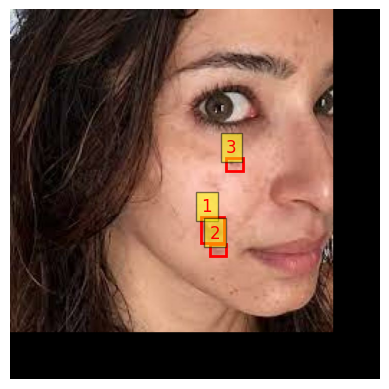

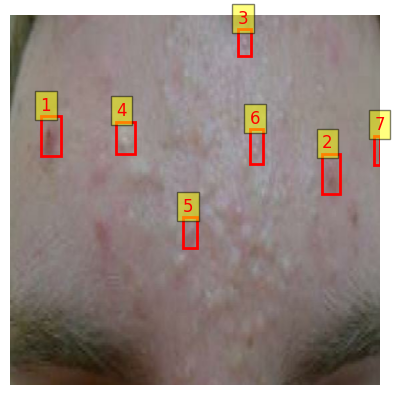

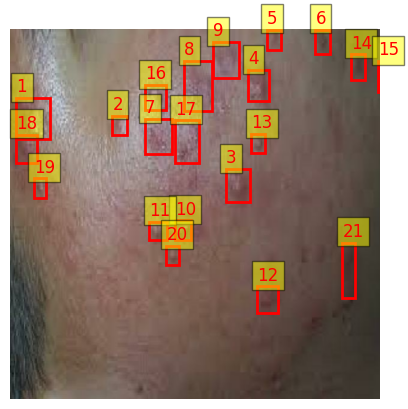

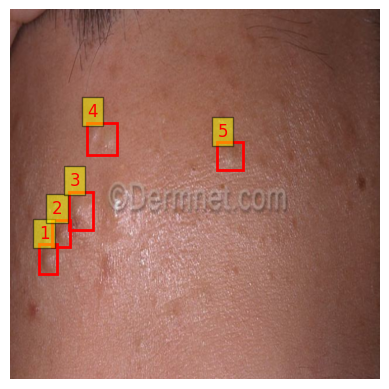

Precision: 0.8026
Recall: 0.8285
F1-Score: 0.8154
Accuracy: 0.8285


<ipython-input-50-bdb3876ea9f2>:62: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + ['Positive', 'Negative'])
<ipython-input-50-bdb3876ea9f2>:63: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([''] + ['Positive', 'Negative'])


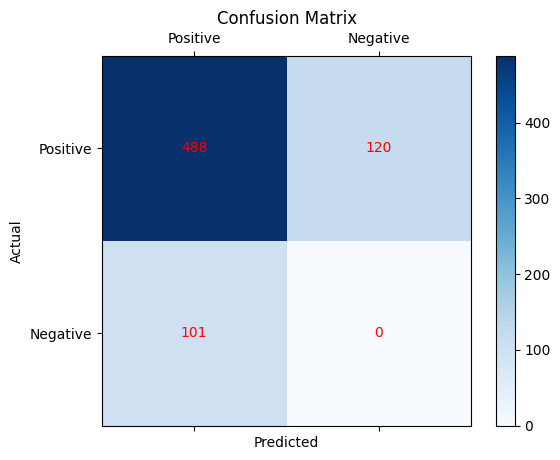

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def is_overlapping(box1, box2):
    """Check if two boxes overlap."""
    x1_overlap = tf.maximum(tf.cast(box1[0], tf.float32), tf.cast(box2[0], tf.float32)) < tf.minimum(tf.cast(box1[2], tf.float32), tf.cast(box2[2], tf.float32))
    y1_overlap = tf.maximum(tf.cast(box1[1], tf.float32), tf.cast(box2[1], tf.float32)) < tf.minimum(tf.cast(box1[3], tf.float32), tf.cast(box2[3], tf.float32))
    return tf.logical_and(x1_overlap, y1_overlap)

def evaluate_model_on_dataset(model, dataset, confidence_threshold=0.2):
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    total_true_boxes = 0

    for images, ground_truth in dataset:
        predictions = model.predict(images, verbose=0)

        true_boxes = ground_truth['boxes']
        pred_boxes = predictions['boxes']
        pred_scores = predictions['confidence']
        num_detections = predictions['num_detections']

        for i in range(true_boxes.shape[0]):
            current_true_boxes = tf.cast(true_boxes[i], tf.float32)  # Ensure correct data type
            current_pred_boxes = tf.cast(pred_boxes[i][:num_detections[i]], tf.float32)  # Get valid predictions with correct data type
            current_pred_scores = pred_scores[i][:num_detections[i]]

            total_true_boxes += tf.shape(current_true_boxes)[0]

            matched_true_boxes = set()

            for j, pred_box in enumerate(current_pred_boxes):
                if current_pred_scores[j] >= confidence_threshold:
                    overlap = tf.reduce_any([is_overlapping(pred_box, true_box) for true_box in current_true_boxes])
                    if overlap:
                        true_positives += 1
                        matched_true_boxes.add(j)
                    else:
                        false_positives += 1

            false_negatives += tf.shape(current_true_boxes)[0] - len(matched_true_boxes)

    precision = true_positives / tf.maximum(tf.cast(true_positives + false_positives, tf.float32), tf.constant(1e-10, dtype=tf.float32))
    recall = true_positives / tf.maximum(tf.cast(true_positives + false_negatives, tf.float32), tf.constant(1e-10, dtype=tf.float32))
    f1_score = 2 * (precision * recall) / tf.maximum(precision + recall, tf.constant(1e-10, dtype=tf.float32))

    accuracy = true_positives / tf.maximum(tf.cast(total_true_boxes, tf.float32), tf.constant(1e-10, dtype=tf.float32))

    return precision, recall, f1_score, accuracy, true_positives, false_positives, false_negatives

def plot_confusion_matrix(tp, fp, fn):
    tn = 0  # True negatives are not directly calculable in object detection

    cm = np.array([[tp, fp], [fn, tn]])

    fig, ax = plt.subplots()
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    plt.colorbar(cax)

    ax.set_xticklabels([''] + ['Positive', 'Negative'])
    ax.set_yticklabels([''] + ['Positive', 'Negative'])

    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    for i in range(2):
        for j in range(2):
            plt.text(j, i, str(cm[i, j]), ha='center', va='center', color='red')

    plt.title('Confusion Matrix')
    plt.show()

def visualize_and_evaluate(model, dataset):
    precision, recall, f1_score, accuracy, tp, fp, fn = evaluate_model_on_dataset(model, dataset)

    # Visualize predictions
    visualize_predictions(dataset=dataset, bounding_box_format="xyxy", class_mapping=class_mapping) # Pass dataset as keyword argument and add class_mapping

    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1_score:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    # Plot confusion matrix
    plot_confusion_matrix(tp, fp, fn)

# Load weights and evaluate model
#yolo_model.load_weights('/kaggle/working/yolo_acne_detection.weights.h5')
visualize_and_evaluate(yolo_model, dataset=testing_dataset)

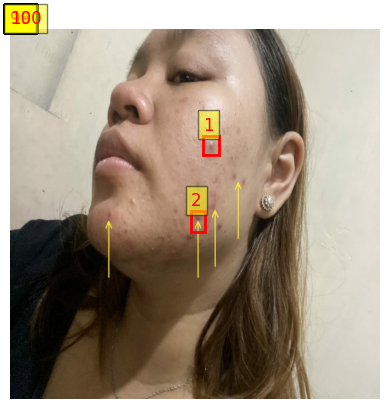

In [ ]:
def visualize_single_image_predictions(model, image_path, bounding_box_format):
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    def load_and_preprocess_image(image_path):
        img = tf.io.read_file(image_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.cast(img, tf.float32)
        img = tf.image.resize(img, (640, 640))
        return img

    img = load_and_preprocess_image(image_path)
    img_batch = tf.expand_dims(img, axis=0)  # Add batch dimension

    # Run inference
    predictions = model.predict(img_batch, verbose=0)

    # Extract predictions for visualization
    bboxes = predictions["boxes"][0]
    classes = predictions["classes"][0].astype(int)

    img_height, img_width = img.shape[0], img.shape[1]

    fig, ax = plt.subplots(1)
    ax.imshow(img.numpy().astype('uint8'))

    # Start numbering bounding boxes from 1
    for idx, (bbox, cls) in enumerate(zip(bboxes, classes), start=1):
        x_min, y_min, x_max, y_max = bbox

        # Calculate width and height
        width = x_max - x_min
        height = y_max - y_min

        # Create a Rectangle patch
        rect = patches.Rectangle(
            (x_min, y_min),
            width,
            height,
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )

        # Add the patch to the Axes
        ax.add_patch(rect)

        # Add sequential number as label on the bounding box
        ax.text(
            x_min,
            y_min - 10,
            str(idx),  # Display the index number
            color='red',
            fontsize=12,
            bbox=dict(facecolor='yellow', alpha=0.5)
        )

    plt.axis('off')
    plt.show()

# Path to your test image
test_image_path = 'test.jpg'  # Replace with your image path

# Visualize predictions on the test image
visualize_single_image_predictions(
    yolo_model, test_image_path, bounding_box_format="xyxy"
)


# Deteksi 3- Jenis Jerawat

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Set the path to the dataset directory
dataset_path = '/content/drive/MyDrive/dataTA_Acnes'  # Replace with your actual dataset path

# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train_jenis', 'images')
valid_images_path = os.path.join(dataset_path, 'valid_jenis', 'images')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def extract_labels_from_annotation(annotation_path):
    labels = []
    with open(annotation_path, 'r', encoding='utf-8-sig') as f:  # Specify encoding to handle BOM
        for line in f:
            if line.strip():
                label = int(line.split()[0])
                labels.append(label)
    return labels

In [ ]:
train_labels_count = {}
for filename in os.listdir(os.path.join(dataset_path, 'train_jenis', 'labels')):
    if filename.endswith('.txt'):
        annotation_path = os.path.join(dataset_path, 'train_jenis', 'labels', filename)
        labels = extract_labels_from_annotation(annotation_path)
        for label in labels:
            train_labels_count[label] = train_labels_count.get(label, 0) + 1

valid_labels_count = {}
for filename in os.listdir(os.path.join(dataset_path, 'valid_jenis', 'labels')):
    if filename.endswith('.txt'):
        annotation_path = os.path.join(dataset_path, 'valid_jenis', 'labels', filename)
        labels = extract_labels_from_annotation(annotation_path)
        for label in labels:
            valid_labels_count[label] = valid_labels_count.get(label, 0) + 1

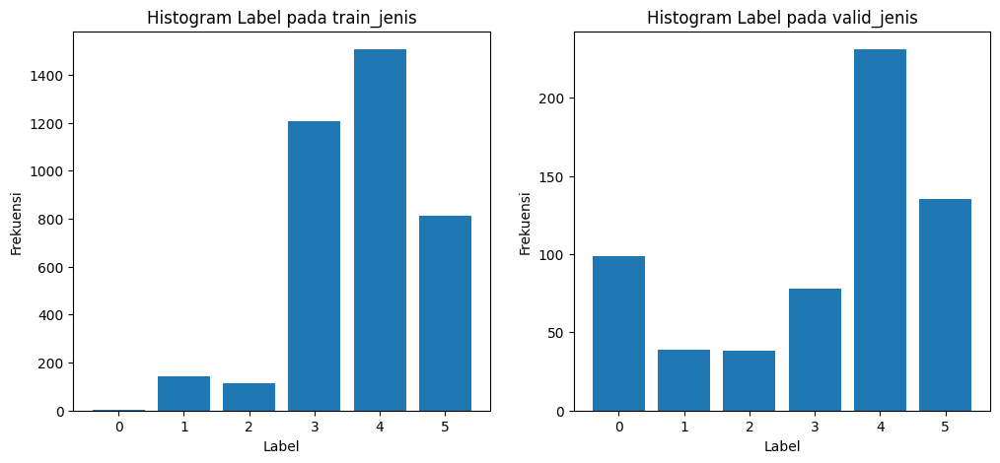

In [ ]:
# Data untuk histogram
train_labels = list(train_labels_count.keys())
train_counts = list(train_labels_count.values())
valid_labels = list(valid_labels_count.keys())
valid_counts = list(valid_labels_count.values())

# Buat subplot
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Histogram untuk data training
axs[0].bar(train_labels, train_counts)
axs[0].set_title('Histogram Label pada train_jenis')
axs[0].set_xlabel('Label')
axs[0].set_ylabel('Frekuensi')

# Histogram untuk data validation
axs[1].bar(valid_labels, valid_counts)
axs[1].set_title('Histogram Label pada valid_jenis')
axs[1].set_xlabel('Label')
axs[1].set_ylabel('Frekuensi')

# Tampilkan histogram
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Set the path to the dataset directory
dataset_path = '/content/drive/MyDrive/dataTA_Acnes'  # Replace with your actual dataset path

# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train2_1', 'images')
valid_images_path = os.path.join(dataset_path, 'valid2', 'images')
test_images_path = os.path.join(dataset_path, 'test2', 'images')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0
num_test_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()
test_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Check test images sizes and count
for filename in os.listdir(test_images_path):
    if filename.endswith('.jpg'):
        num_test_images += 1
        image_path = os.path.join(test_images_path, filename)
        with Image.open(image_path) as img:
            test_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")
print(f"Number of test images: {num_test_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

# Check if all images in test set have the same size
if len(test_image_sizes) == 1:
    print(f"All test images have the same size: {test_image_sizes.pop()}")
else:
    print("Test images have varying sizes.")


Number of training images: 130
Number of validation images: 47
Number of test images: 45
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)
All test images have the same size: (640, 640)


**preprocessing**

In [ ]:
# Fungsi untuk mengonversi file txt menjadi daftar
def convert_txt_to_annotations(img_path, txt_path):
    img = cv2.imread(img_path)
    img_width = int(img.shape[0])
    img_height = int(img.shape[1])

    with open(txt_path, "r", encoding='utf-8-sig') as file_label:
        lines = file_label.read().split('\n')

    bounding_boxes = []
    object_classes = []

    if lines[0] == '':
        return img_path, object_classes, bounding_boxes
    else:
        for line in lines:
            if line.strip():  # Memastikan baris tidak kosong
                data = line.split(' ')
                class_id = int(data[0])

                x_center = float(data[1])
                y_center = float(data[2])
                box_width = float(data[3])
                box_height = float(data[4])

                x_min = int((x_center * img_width) - (box_width * img_width) / 2.0)
                y_min = int((y_center * img_height) - (box_height * img_height) / 2.0)
                x_max = int((x_center * img_width) + (box_width * img_width) / 2.0)
                y_max = int((y_center * img_height) + (box_height * img_height) / 2.0)

                bounding_boxes.append([x_min, y_min, x_max, y_max])
                object_classes.append(class_id)

    return img_path, object_classes, bounding_boxes


# Fungsi untuk membuat daftar jalur file
def list_file_paths(path):
    file_paths = []
    sorted_files = sorted(os.listdir(path))

    for file in sorted_files:
        file_paths.append(os.path.join(path, file))

    return file_paths


# Daftar ID kelas
class_identifiers = ['Acne']

# Pemetaan kelas
label_mapping = {
    0: 'Acne',
    1: 'Komedo Hitam',
    2: 'Komedo Putih',
    3: 'Nodul',
    4: 'Papule',
    5: 'Pustule'
}


In [ ]:
# Fungsi untuk membuat format kamus dari file
def generate_file_dict(image_file_dir, annotation_file_dir):
    # Membuat daftar jalur file untuk gambar dan anotasi
    image_file_list = list_file_paths(image_file_dir)
    annotation_file_list = list_file_paths(annotation_file_dir)

    # Inisialisasi daftar untuk menyimpan hasil
    image_references = []
    bounding_boxes = []
    class_labels = []

    # Menentukan panjang minimum untuk mencegah indeks keluar dari rentang
    minimum_length = min(len(image_file_list), len(annotation_file_list))

    for idx in range(minimum_length):  # Iterasi hingga panjang minimum
        img_path, labels, boxes = convert_txt_to_annotations(image_file_list[idx], annotation_file_list[idx])
        image_references.append(img_path)
        bounding_boxes.append(boxes)
        class_labels.append(labels)

    # Konversi daftar menjadi TensorFlow ragged tensor
    image_references = tf.ragged.constant(image_references)
    bounding_boxes = tf.ragged.constant(bounding_boxes)
    class_labels = tf.ragged.constant(class_labels)

    return image_references, class_labels, bounding_boxes


In [ ]:
# Membuat dataset loader
train_image_paths, train_labels, train_bounding_boxes = generate_file_dict(
    '/content/drive/MyDrive/dataTA_Acnes/train2_1/images',
    '/content/drive/MyDrive/dataTA_Acnes/train2_1/labels'
)

valid_image_paths, valid_labels, valid_bounding_boxes = generate_file_dict(
    '/content/drive/MyDrive/dataTA_Acnes/valid2/images',
    '/content/drive/MyDrive/dataTA_Acnes/valid2/labels'
)

test_image_paths, test_labels, test_bounding_boxes = generate_file_dict(
    '/content/drive/MyDrive/dataTA_Acnes/test2/images',
    '/content/drive/MyDrive/dataTA_Acnes/test2/labels'
)


In [ ]:
# Fungsi untuk membaca dan meresize gambar
def process_image(image_filepath):
    image_content = tf.io.read_file(image_filepath)
    image = tf.image.decode_jpeg(image_content, channels=3)
    image = tf.cast(image, tf.float32)

    return image


# Resizing layer dengan jitter
jittered_resize_layer = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    scale_factor=(0.8, 1.25),
    bounding_box_format="xyxy")

# Fungsi untuk memuat dataset gambar
def load_image_dataset(image_filepaths, label_list, bounding_box_list):
    image_data = process_image(image_filepaths)

    bounding_box_info = {
        "classes": tf.cast(label_list, dtype=tf.float32),
        "boxes": bounding_box_list
    }

    return {"images": image_data, "bounding_boxes": bounding_box_info}

# Fungsi untuk mengubah dictionary menjadi tuple
def transform_dict_to_tuple(dataset):
    return dataset["images"], dataset["bounding_boxes"]


In [ ]:
# Creating dataset loaders and tf.datasets
train_dataset_loader1 = tf.data.Dataset.from_tensor_slices((train_image_paths, train_labels, train_bounding_boxes)) # Fixed: Removed the '1' suffix from variable names
train_tf_dataset1 = (train_dataset_loader1
                     .map(load_image_dataset, num_parallel_calls=AUTO)  # Fixed: Removed the '1' suffix from the function name
                     .shuffle(BATCH_SIZE * 10)
                     .ragged_batch(BATCH_SIZE, drop_remainder=True)
                     .map(jittered_resize_layer, num_parallel_calls=AUTO)
                     .map(transform_dict_to_tuple, num_parallel_calls=AUTO)  # Fixed: Removed the '1' suffix from the function name
                     .prefetch(AUTO))

valid_dataset_loader1 = tf.data.Dataset.from_tensor_slices((valid_image_paths, valid_labels, valid_bounding_boxes)) # Fixed: Removed the '1' suffix from variable names
valid_tf_dataset1 = (valid_dataset_loader1
                     .map(load_image_dataset, num_parallel_calls=AUTO)  # Fixed: Removed the '1' suffix from the function name
                     .ragged_batch(BATCH_SIZE, drop_remainder=True)
                     .map(jittered_resize_layer, num_parallel_calls=AUTO)
                     .map(transform_dict_to_tuple, num_parallel_calls=AUTO)  # Fixed: Removed the '1' suffix from the function name
                     .prefetch(AUTO))

test_dataset_loader1 = tf.data.Dataset.from_tensor_slices((test_image_paths, test_labels, test_bounding_boxes)) # Fixed: Removed the '1' suffix from variable names
test_tf_dataset1 = (test_dataset_loader1
                    .map(load_image_dataset, num_parallel_calls=AUTO)  # Fixed: Removed the '1' suffix from the function name
                    .ragged_batch(BATCH_SIZE, drop_remainder=True)
                    .map(jittered_resize_layer, num_parallel_calls=AUTO)
                    .map(transform_dict_to_tuple, num_parallel_calls=AUTO)  # Fixed: Removed the '1' suffix from the function name
                    .prefetch(AUTO))

In [ ]:
# Fungsi untuk memvisualisasikan sampel dari dataset
def display_dataset_samples(dataset, value_range, rows, cols, bbox_format):
    # Ambil sampel pertama dari dataset
    sample_data = next(iter(dataset.take(1)))
    images_data, boxes_data = sample_data[0], sample_data[1]

    # Memvisualisasikan bounding box dengan KerasCV
    keras_cv.visualization.plot_bounding_box_gallery(
        images_data,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=boxes_data,
        scale=6,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        bounding_box_format=bbox_format,
        class_mapping=label_mapping,
        true_color=(192, 57, 43))


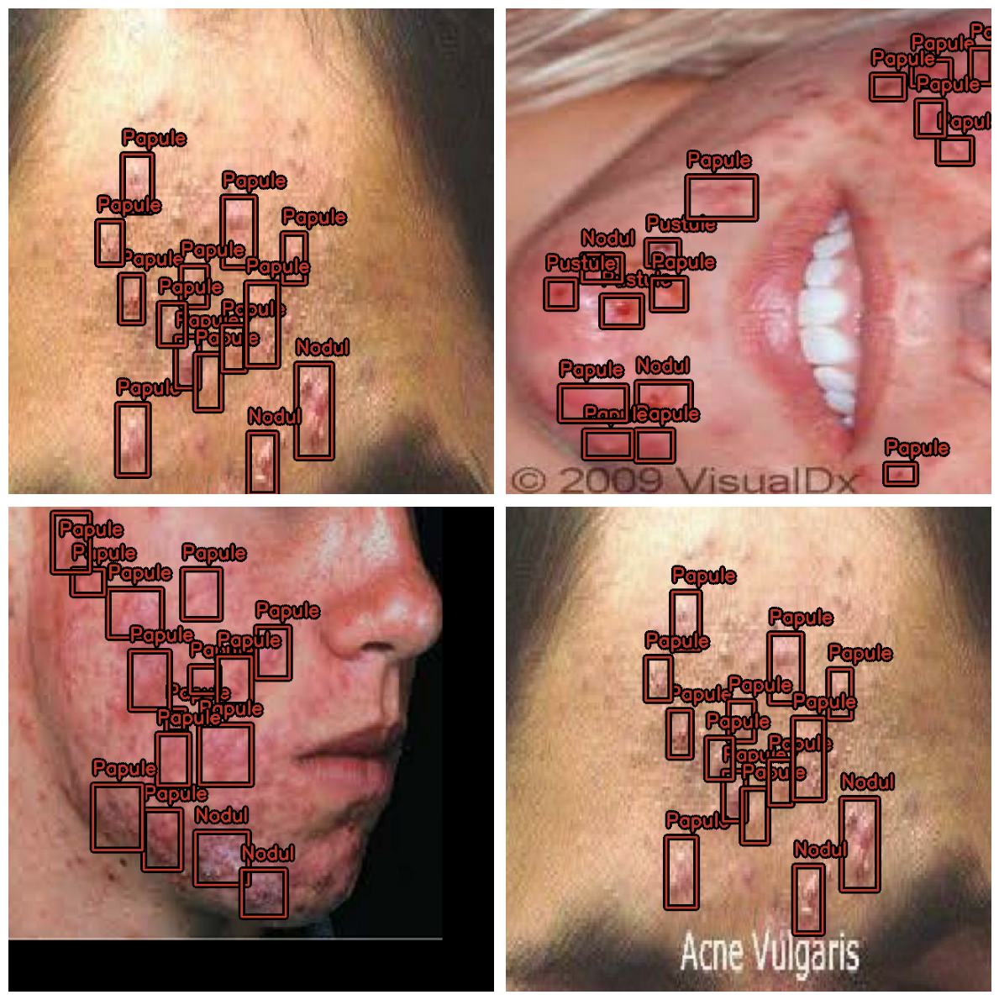

In [ ]:
# Menampilkan contoh gambar dan anotasi dari dataset pelatihan
display_dataset_samples(train_tf_dataset1, bbox_format="xyxy", value_range=(0, 255), rows=2, cols=2)


**training yolov8 model**

In [ ]:
# Membuat strategi mirrored
mirrored_strategy = tf.distribute.MirroredStrategy()


In [ ]:
# Membuat backbone YOLO
with mirrored_strategy.scope():
    yolo_backbone_model = keras_cv.models.YOLOV8Backbone.from_preset(
        "yolo_v8_xs_backbone", include_rescaling=True
    )

    yolo_model_detector = keras_cv.models.YOLOV8Detector(
        num_classes=len(label_mapping),  # class_mapping harus didefinisikan sebelumnya
        bounding_box_format="xyxy",
        backbone=yolo_backbone_model,
        fpn_depth=5
    )

    # Optimizer dengan decay learning rate dan weight decay untuk regularisasi
    model_optimizer = AdamW(
        learning_rate=0.0007, weight_decay=0.0009, global_clipnorm=5.0
    )

    # Callbacks dengan early stopping, pengurangan learning rate, dan model checkpoint
    training_callbacks = [
        ModelCheckpoint(
            '/kaggle/working/yolo_acne_detection.weights.h5',
            monitor='val_loss',
            save_best_only=True,
            save_weights_only=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            verbose=1,
            min_delta= 0.001,
            min_lr=1e-6  # Batas minimum learning rate
        ),
        EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    ]

    # Compile the model within the strategy's scope
    yolo_model_detector.compile(
        optimizer=model_optimizer,
        classification_loss='binary_crossentropy',
        box_loss='ciou'  # Add the box_loss argument, here using 'ciou'
    )


In [ ]:
# Melatih model
training_history = yolo_model_detector.fit(
    train_tf_dataset1,
    validation_data=valid_tf_dataset1,
    epochs=140,
    batch_size=32,
    callbacks=training_callbacks
)


Epoch 1/140
8/8 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - box_loss: 5.0068 - class_loss: 172.3663 - loss: 177.3731 - val_box_loss: 5.4147 - val_class_loss: 194.0504 - val_loss: 199.4651 - learning_rate: 7.0000e-04
Epoch 2/140
8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - box_loss: 4.7589 - class_loss: 117.1801 - loss: 121.9390 - val_box_loss: 5.4308 - val_class_loss: 126.4572 - val_loss: 131.8881 - learning_rate: 7.0000e-04
Epoch 3/140
8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - box_loss: 4.4311 - class_loss: 87.4833 - loss: 91.9144 - val_box_loss: 5.0609 - val_class_loss: 70.6909 - val_loss: 75.7517 - learning_rate: 7.0000e-04
Epoch 4/140
8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - box_loss: 4.0989 - class_loss: 101.0866 - loss: 105.1855 - val_box_loss: 4.8007 - val_class_loss: 70.7589 - val_loss: 75.5596 - learning_rate: 7.0000e-04
Epoch 5/140
8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - box_loss: 3.8879 - class_loss: 89.8734 - loss: 93.7612 - val_box_loss: 4.0423 - val_class_loss: 58.4072 - val_loss: 62.4495 - le

In [ ]:
# Setelah melatih model
yolo_model_detector.save('yolo_acne_detection_model_type.h5')


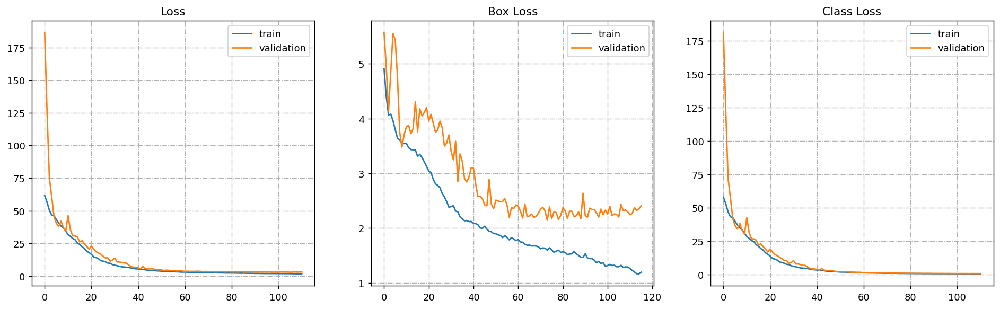

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(18, 5), dpi=130)

axs[0].grid(linestyle="dashdot")
axs[0].set_title("Loss")
axs[0].plot(training_history.history['loss'][5:])
axs[0].plot(training_history.history['val_loss'][5:])
axs[0].legend(["train", "validation"])

axs[1].grid(linestyle="dashdot")
axs[1].set_title("Box Loss")
axs[1].plot(training_history.history['box_loss'])
axs[1].plot(training_history.history['val_box_loss'])
axs[1].legend(["train", "validation"])

axs[2].grid(linestyle="dashdot")
axs[2].set_title("Class Loss")
axs[2].plot(training_history.history['class_loss'][5:])
axs[2].plot(training_history.history['val_class_loss'][5:])
axs[2].legend(["train", "validation"])


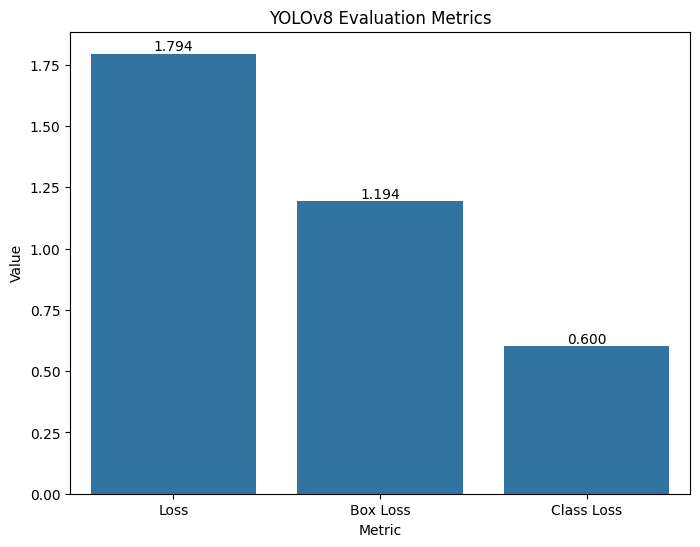

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Mengasumsikan 'training_history' adalah objek History dari pelatihan model
# Menentukan metrik yang ingin dipetakan
metrics = [("Loss", 'loss', 'val_loss'),
           ("Box Loss", 'box_loss', 'val_box_loss'),
           ("Class Loss", 'class_loss', 'val_class_loss')]

# Membuat grafik bar
plt.figure(figsize=(8, 6))

# Menyaring label dan nilai dari daftar metrics
labels = [metric[0] for metric in metrics]
values = [training_history.history[metric[1]][-1] for metric in metrics]

sns.barplot(x=labels, y=values)
plt.title('YOLOv8 Evaluation Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')

# Menambahkan nilai di atas batang
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.3f}', ha='center', va='bottom')

plt.show()


**test prediction**

In [ ]:
evaluation_result = yolo_model_detector.evaluate(test_tf_dataset1)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step - box_loss: 2.1673 - class_loss: 0.8443 - loss: 3.0116


In [ ]:
def display_prediction_detections(model, dataset, bbox_format):
    sample_images, true_labels = next(iter(dataset.take(1)))

    predicted_boxes = model.predict(sample_images, verbose=0)
    # Alih-alih mengonversi ke ragged, gunakan to_dense
    predicted_boxes = keras_cv.bounding_box.to_dense(predicted_boxes)

    keras_cv.visualization.plot_bounding_box_gallery(
        sample_images,
        value_range=(0, 255),
        bounding_box_format=bbox_format,
        y_true=true_labels,
        y_pred=predicted_boxes,
        true_color=(192, 57, 43),
        pred_color=(255, 235, 59),
        scale=8,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        rows=2,
        cols=2,
        show=True,
        class_mapping=label_mapping,
    )


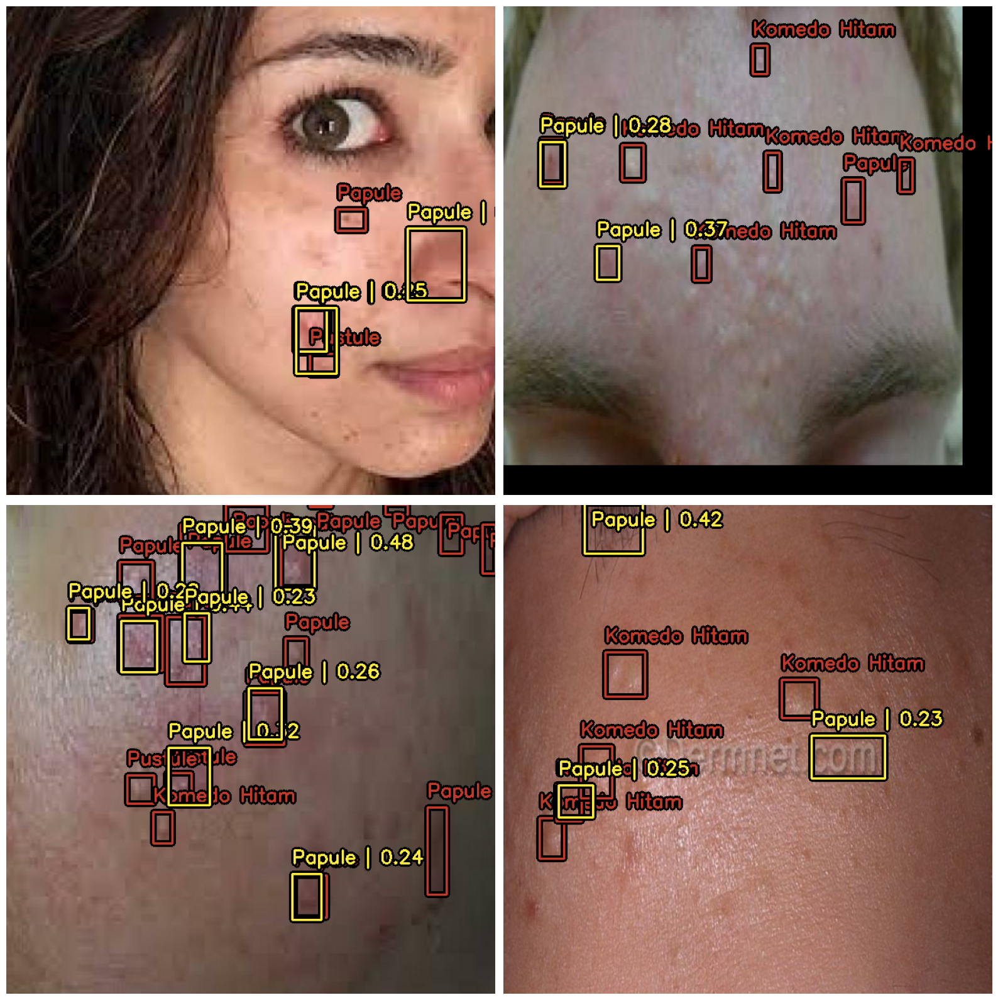

In [ ]:
# Merah -> ground truth
# Kuning -> prediksi

# yolo_detector_model.load_weights('/kaggle/working/yolo_acne_detection.weights.h5')
display_prediction_detections(yolo_model_detector, dataset=test_tf_dataset1, bbox_format="xyxy")


In [ ]:
for sample_images, true_labels in test_tf_dataset1.take(1):
    predicted_boxes = yolo_model_detector.predict(sample_images, verbose=0)
    print(predicted_boxes)


{'boxes': array([[[330.53262  , 355.8806   , 360.6903   , 399.30704  ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        ...,
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ]],

       [[ 93.39634  , 309.4871   , 128.90358  , 361.7819   ],
        [  4.148918 , 147.9397   ,  43.959846 , 213.92719  ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        ...,
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ],
        [ -1.       ,  -1.       ,  -1.       ,  -1.       ]],

       [[269.9586   ,  80.0607   , 315.2077   , 136.36652  ],
        [327.69272  , 236.29402  , 383.25446  , 310.53064  ],
        [202.79599  ,  56.86643  , 229.94554  , 101.03421  ],
        ...,
        [ -1.    

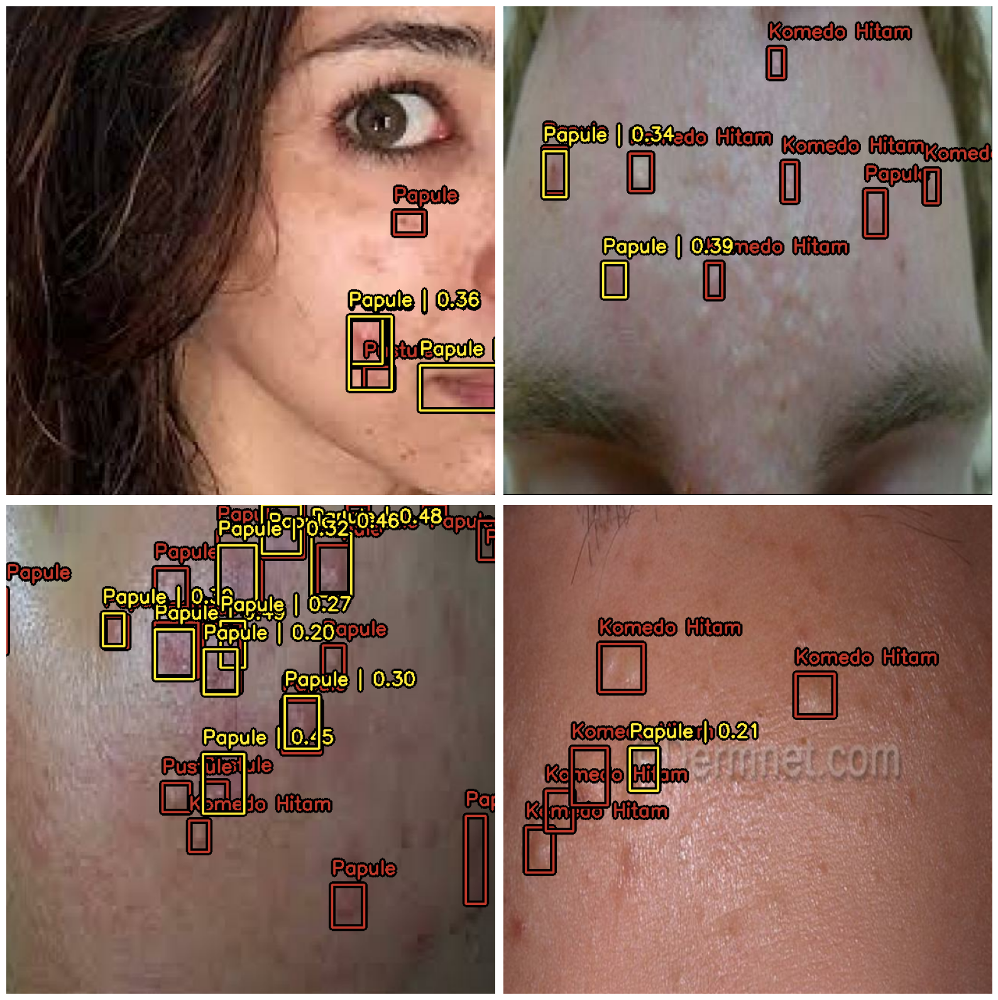

Precision: 0.7208
Recall: 0.4987
F1-Score: 0.5895
Accuracy: 0.4987


<ipython-input-101-0077d92d9c23>:62: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + ['Positive', 'Negative'])
<ipython-input-101-0077d92d9c23>:63: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([''] + ['Positive', 'Negative'])


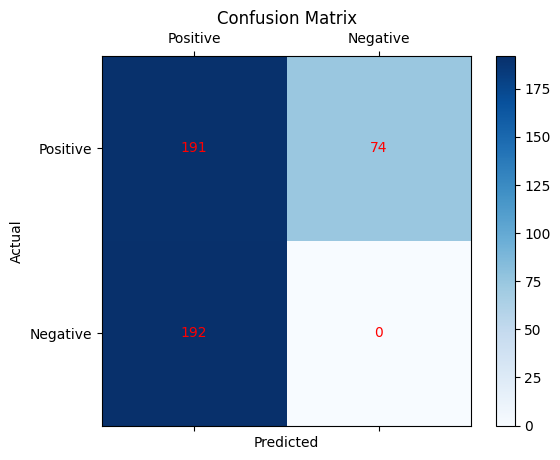

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def check_overlap_between_boxes(box_a, box_b):
    """Check if two boxes overlap."""
    x1_overlap = tf.maximum(tf.cast(box_a[0], tf.float32), tf.cast(box_b[0], tf.float32)) < tf.minimum(tf.cast(box_a[2], tf.float32), tf.cast(box_b[2], tf.float32))
    y1_overlap = tf.maximum(tf.cast(box_a[1], tf.float32), tf.cast(box_b[1], tf.float32)) < tf.minimum(tf.cast(box_a[3], tf.float32), tf.cast(box_b[3], tf.float32))
    return tf.logical_and(x1_overlap, y1_overlap)

def evaluate_metrics_on_data(model, data, threshold=0.2):
    true_positives_count = 0
    false_positives_count = 0
    false_negatives_count = 0
    ground_truth_boxes_total = 0

    for batch_images, true_labels in data:
        predictions = model.predict(batch_images, verbose=0)

        true_boxes = true_labels['boxes']
        predicted_boxes = predictions['boxes']
        predicted_confidences = predictions['confidence']
        num_valid_detections = predictions['num_detections']

        for i in range(true_boxes.shape[0]):
            true_boxes_for_current_image = tf.cast(true_boxes[i], tf.float32)
            predicted_boxes_for_current_image = tf.cast(predicted_boxes[i][:num_valid_detections[i]], tf.float32)
            predicted_scores_for_current_image = predicted_confidences[i][:num_valid_detections[i]]

            ground_truth_boxes_total += tf.shape(true_boxes_for_current_image)[0]

            matched_true_boxes = set()

            for j, pred_box in enumerate(predicted_boxes_for_current_image):
                if predicted_scores_for_current_image[j] >= threshold:
                    overlap_detected = tf.reduce_any([check_overlap_between_boxes(pred_box, true_box) for true_box in true_boxes_for_current_image])
                    if overlap_detected:
                        true_positives_count += 1
                        matched_true_boxes.add(j)
                    else:
                        false_positives_count += 1

            false_negatives_count += tf.shape(true_boxes_for_current_image)[0] - len(matched_true_boxes)

    precision_metric = true_positives_count / tf.maximum(tf.cast(true_positives_count + false_positives_count, tf.float32), tf.constant(1e-10, dtype=tf.float32))
    recall_metric = true_positives_count / tf.maximum(tf.cast(true_positives_count + false_negatives_count, tf.float32), tf.constant(1e-10, dtype=tf.float32))
    f1_score_metric = 2 * (precision_metric * recall_metric) / tf.maximum(precision_metric + recall_metric, tf.constant(1e-10, dtype=tf.float32))

    accuracy_metric = true_positives_count / tf.maximum(tf.cast(ground_truth_boxes_total, tf.float32), tf.constant(1e-10, dtype=tf.float32))

    return precision_metric, recall_metric, f1_score_metric, accuracy_metric, true_positives_count, false_positives_count, false_negatives_count

def plot_performance_matrix(true_pos, false_pos, false_neg):
    true_neg = 0  # True negatives are not directly calculable in object detection

    confusion_matrix_values = np.array([[true_pos, false_pos], [false_neg, true_neg]])

    fig, ax = plt.subplots()
    cax = ax.matshow(confusion_matrix_values, cmap=plt.cm.Blues)
    plt.colorbar(cax)

    ax.set_xticklabels([''] + ['Positive', 'Negative'])
    ax.set_yticklabels([''] + ['Positive', 'Negative'])

    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    for i in range(2):
        for j in range(2):
            plt.text(j, i, str(confusion_matrix_values[i, j]), ha='center', va='center', color='red')

    plt.title('Confusion Matrix')
    plt.show()

def visualize_and_evaluate_model_performance(model, dataset):
    precision, recall, f1_score, accuracy, tp_val, fp_val, fn_val = evaluate_metrics_on_data(model, dataset)

    # Visualize predictions
    # Renamed the function to display_model_predictions
    display_prediction_detections(model, dataset, bbox_format="xyxy")

    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1_score:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    # Plot confusion matrix
    plot_performance_matrix(tp_val, fp_val, fn_val)

# Load weights and evaluate model
# yolo_detector_model.load_weights('/kaggle/working/yolo_acne_detection.weights.h5')
visualize_and_evaluate_model_performance(yolo_model_detector, dataset=test_tf_dataset1)


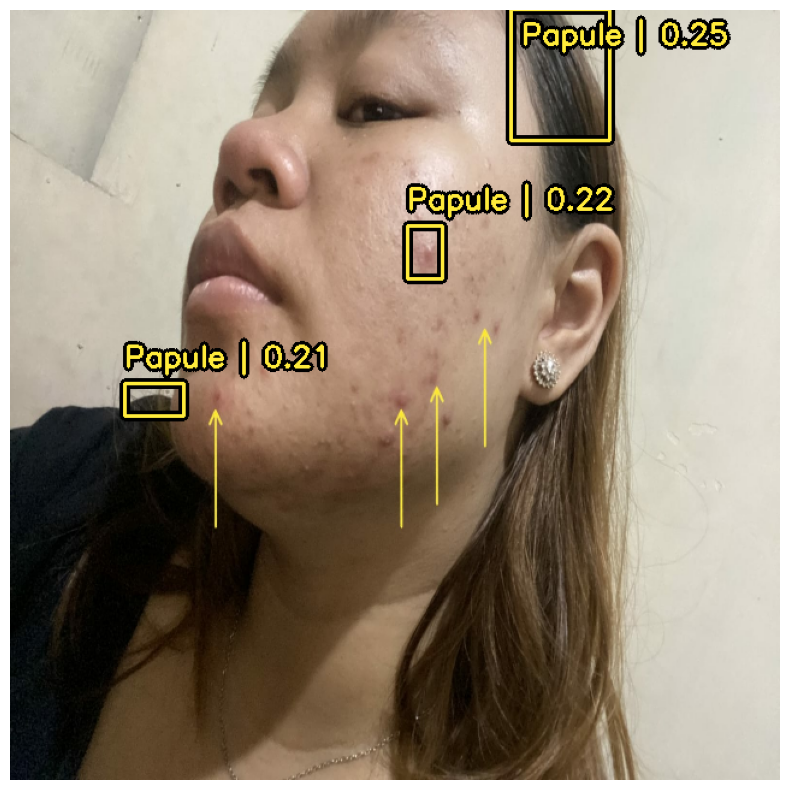

In [ ]:
# Fungsi untuk memuat dan memproses gambar
def load_and_resize_image(image_filepath):
    image_data = tf.io.read_file(image_filepath)
    image = tf.image.decode_jpeg(image_data, channels=3)
    image = tf.cast(image, tf.float32)
    # Resize ke ukuran input yang diharapkan oleh model (640x640)
    image = tf.image.resize(image, (640, 640))
    return image

def visualize_predictions_on_image(model, image_filepath, bbox_format):
    processed_image = load_and_resize_image(image_filepath)
    image_batch = tf.expand_dims(processed_image, axis=0)  # Menambahkan dimensi batch

    # Jalankan inferensi
    predictions = model.predict(image_batch, verbose=0)

    # Visualisasikan prediksi
    keras_cv.visualization.plot_bounding_box_gallery(
        image_batch,
        value_range=(0, 255),
        bounding_box_format=bbox_format,
        y_pred=predictions,
        pred_color=(255, 235, 59),  # Warna kuning untuk prediksi
        scale=8,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        rows=1,
        cols=1,
        show=True,
        class_mapping=label_mapping,  # Pastikan class_mapping didefinisikan dengan benar
    )


# Path ke gambar uji
test_image_filepath = 'test.jpg'  # Ganti dengan path gambar Anda

# Visualisasikan prediksi pada gambar uji
visualize_predictions_on_image(
    yolo_model_detector, test_image_filepath, bbox_format="xyxy"
)
